# Read data

Reading in the satellite data from a saved .npy file, and the classified data from a .tif. Plot the data. (.npy saved by save_sat_npy.py)

In [1]:
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
import rasterio as rio
import earthpy.plot as ep
from matplotlib.colors import ListedColormap
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from tensorflow.keras.layers import Conv3D, Input, Reshape, Flatten, Conv2D, Dense, Dropout
from tensorflow.keras import Model
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
from datetime import datetime
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import rioxarray
import a301_lib
import plotly.express as px
import pandas as pd

in a301_lib init


In [2]:
# Reading in classified data.

def get_copern_xarray(lat, lon, size):
    lat_range = np.array([size, -size]) + lat
    lon_range = np.array([-size, size]) + lon

    copern_tif  = "./data/PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326.tif"
    copern_xarray = rioxarray.open_rasterio(copern_tif)
    copern_xarray = copern_xarray.sel(y=slice(lat_range[0], lat_range[1]), x=slice(lon_range[0], lon_range[1]))

    return copern_xarray

def get_feature_dict(band_xarray):
    flag_meanings = band_xarray.flag_meanings.split(", ")
    flag_values = list(map(int, band_xarray.flag_values.split(", ")))

    n_cats = len(flag_values)
    cat = np.arange(n_cats)

    val_to_cat = dict(zip(flag_values, cat))
    cat_to_mean = dict(zip(cat, flag_meanings))
    val_to_mean = dict(zip(flag_values, flag_meanings))
    return val_to_mean, cat_to_mean

# Converting data to have sequential values for plotting.
def convert_copern_xarray(copern_xarray):
    flag_meanings = copern_xarray.flag_meanings.split(", ")
    flag_values = list(map(int, copern_xarray.flag_values.split(", ")))

    n_cats = len(flag_values)
    cat = np.arange(n_cats)

    val_to_cat = dict(zip(flag_values, cat))
    cat_to_mean = dict(zip(cat, flag_meanings))

    out = copern_xarray.rio.transform()

    xarray_values = copern_xarray.data
    xarray_values = xarray_values.squeeze()

    #rewrite the classification ints
    vals = xarray_values
    vals_shape = xarray_values.shape
    vals = list(vals.flatten())

    sort_key = [val_to_cat[v] for v in vals]
    xarray_values = np.reshape(sort_key, vals_shape)
    
    return xarray_values

In [3]:
# Call the above functions to get an array for ground truth and one with satellite data.

lat = 49.2827
lon = -123.120
size = 0.25
band_combinations = ["all", "false_colour"]
colors = band_combinations[0]
# jan, apr, july, oct
date_combinations = ["2019-01-01/2019-01-31", "2019-04-01/2019-04-30", "2019-07-01/2019-07-31", "2019-10-01/2019-10-31"]
date = date_combinations[2]

# Ground Truth
copern_xarray = get_copern_xarray(lat, lon, size)
val_to_mean, cat_to_mean = get_feature_dict(copern_xarray)
y_data = convert_copern_xarray(copern_xarray)
unique_classes = np.unique(y_data)

# Data
arr_st = np.load("./data/arr_st.npy")
data_shape = arr_st.shape[1:]

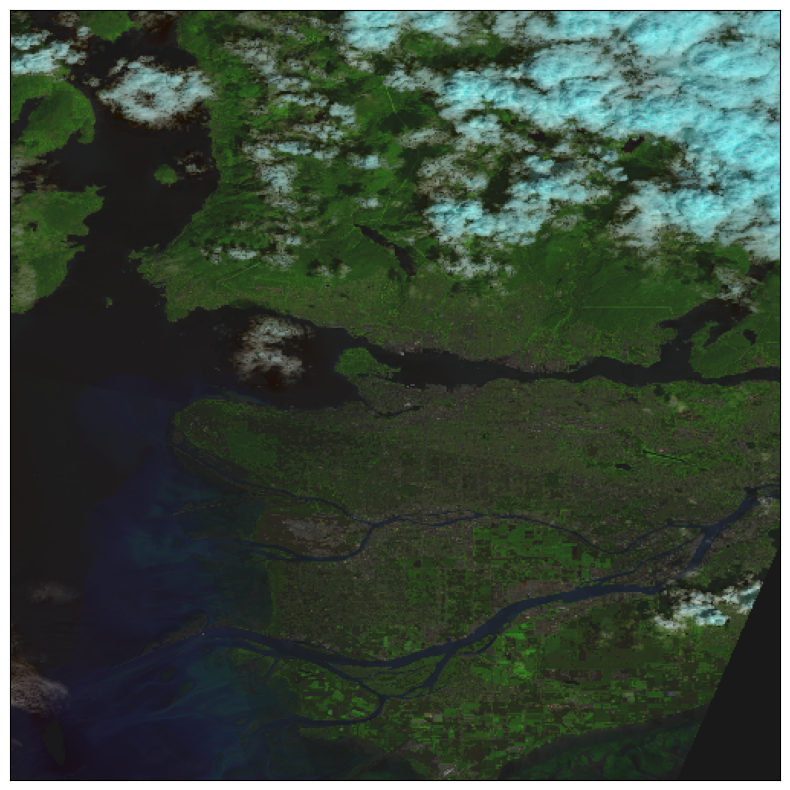

In [4]:
# Plot satellite data
ep.plot_rgb(
    arr_st,
    rgb=(7, 3, 2),
)

plt.show()

In [5]:
# Plot classified data

fig = px.imshow(y_data)

fig.update_coloraxes(
    colorscale=px.colors.qualitative.Dark24,
    colorbar_tickvals=list(cat_to_mean.keys()),
    colorbar_ticktext=list(cat_to_mean.values()),
    colorbar_tickmode="array",
)

fig.show()
print(cat_to_mean) # to help reading the plot

{0: 'unknown', 1: 'ENF_closed', 2: 'EBF_closed', 3: 'DNF_closed', 4: 'DBF_closed', 5: 'mixed _closed', 6: 'unknown_closed', 7: 'ENF_open', 8: 'EBF_open', 9: 'DNF_open', 10: 'DBF_open', 11: 'mixed _open', 12: 'unknown_open', 13: 'shrubland', 14: 'herbaceous_vegetation', 15: 'cropland', 16: 'built-up', 17: 'bare_sparse_vegetation', 18: 'snow_ice', 19: 'permanent_inland_water', 20: 'herbaceous_wetland', 21: 'moss_lichen', 22: 'sea'}


# CNN
Setting up the CNN model. Following these links pretty closely.
- https://towardsdatascience.com/land-cover-classification-of-satellite-imagery-using-convolutional-neural-networks-91b5bb7fe808
- https://medium.com/geekculture/remote-sensing-deep-learning-for-land-cover-classification-of-satellite-imagery-using-python-6a7b4c4f570f
- https://github.com/syamkakarla98/Satellite_Imagery_Analysis

In [6]:
def applyPCA(X, numComponents=75):
    newX = np.reshape(X, (-1, X.shape[2]))
    pca = PCA(n_components=numComponents, whiten=True)
    newX = pca.fit_transform(newX)
    newX = np.reshape(newX, (X.shape[0],X.shape[1], numComponents))
    return newX, pca

def padWithZeros(X, margin=2):
    newX = np.zeros((X.shape[0] + 2 * margin, X.shape[1] + 2* margin, X.shape[2]))
    x_offset = margin
    y_offset = margin
    newX[x_offset:X.shape[0] + x_offset, y_offset:X.shape[1] + y_offset, :] = X
    return newX

def createImageCubes(X, y, windowSize=5, removeZeroLabels=False):
    margin = int((windowSize - 1) / 2)
    zeroPaddedX = padWithZeros(X, margin=margin)
    # split patches
    patchesData = np.zeros((X.shape[0] * X.shape[1], windowSize, windowSize, X.shape[2]))
    patchesLabels = np.zeros((X.shape[0] * X.shape[1]))
    patchIndex = 0
    for r in range(margin, zeroPaddedX.shape[0] - margin):
        for c in range(margin, zeroPaddedX.shape[1] - margin):
            patch = zeroPaddedX[r - margin:r + margin + 1, c - margin:c + margin + 1]   
            patchesData[patchIndex, :, :, :] = patch
            patchesLabels[patchIndex] = y[r-margin, c-margin]
            patchIndex = patchIndex + 1
    if removeZeroLabels:
        patchesData = patchesData[patchesLabels>0,:,:,:]
        patchesLabels = patchesLabels[patchesLabels>0]
        patchesLabels -= 1
    return patchesData, patchesLabels

def splitTrainTestSet(X, y, testRatio, randomState=42):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=testRatio, random_state=randomState, stratify=y)
    return X_train, X_test, y_train, y_test
  
## GLOBAL VARIABLES
dataset = 'SB'
test_size = 0.30
windowSize = 15

X_data = np.moveaxis(arr_st, 0, -1)

# Apply PCA
K = 5
X,pca = applyPCA(X_data,numComponents=K)

print(f'Data After PCA: {X.shape}')

# Create 3D Patches
X, y = createImageCubes(X, y_data, windowSize=windowSize)
print(f'Patch size: {X.shape}')

# Split train and test
X_train, X_test, y_train, y_test = splitTrainTestSet(X, y, testRatio=test_size)

X_train = X_train.reshape(-1, windowSize, windowSize, K, 1)
X_test = X_test.reshape(-1, windowSize, windowSize, K, 1)

# One Hot Encoding
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

print(f'Train: {X_train.shape}\nTest: {X_test.shape}\nTrain Labels: {y_train.shape}\nTest Labels: {y_test.shape}')

Data After PCA: (504, 504, 5)
Patch size: (254016, 15, 15, 5)
Train: (177811, 15, 15, 5, 1)
Test: (76205, 15, 15, 5, 1)
Train Labels: (177811, 23)
Test Labels: (76205, 23)


In [7]:
S = windowSize
L = K
output_units = y_train.shape[1]

## input layer
input_layer = Input((S, S, L, 1))

## convolutional layers
conv_layer1 = Conv3D(filters=16, kernel_size=(2, 2, 3), activation='relu')(input_layer)
conv_layer2 = Conv3D(filters=32, kernel_size=(2, 2, 3), activation='relu')(conv_layer1)
conv2d_shape = conv_layer2.shape
conv_layer3 = Reshape((conv2d_shape[1], conv2d_shape[2], conv2d_shape[3]*conv2d_shape[4]))(conv_layer2)
conv_layer4 = Conv2D(filters=64, kernel_size=(2,2), activation='relu')(conv_layer3)

flatten_layer = Flatten()(conv_layer4)

## fully connected layers
dense_layer1 = Dense(128, activation='relu')(flatten_layer)
dense_layer1 = Dropout(0.4)(dense_layer1)
dense_layer2 = Dense(64, activation='relu')(dense_layer1)
dense_layer2 = Dropout(0.4)(dense_layer2)
dense_layer3 = Dense(20, activation='relu')(dense_layer2)
dense_layer3 = Dropout(0.4)(dense_layer3)
output_layer = Dense(units=output_units, activation='softmax')(dense_layer3)
# define the model with input layer and output layer
model = Model(name = dataset+'_Model' , inputs=input_layer, outputs=output_layer)

model.summary()

Model: "SB_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 15, 15, 5, 1)]    0         
                                                                 
 conv3d (Conv3D)             (None, 14, 14, 3, 16)     208       
                                                                 
 conv3d_1 (Conv3D)           (None, 13, 13, 1, 32)     6176      
                                                                 
 reshape (Reshape)           (None, 13, 13, 32)        0         
                                                                 
 conv2d (Conv2D)             (None, 12, 12, 64)        8256      
                                                                 
 flatten (Flatten)           (None, 9216)              0         
                                                                 
 dense (Dense)               (None, 128)               117

# Training

In [8]:
# Compile
import os
from pathlib import Path

model.compile(optimizer = 'adam', loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

# Callbacks
logdir = os.path.normpath("data/logs/" +model.name+'_'+datetime.now().strftime("%d-%m-%Y-%H-%M-%S"))

tensorboard_callback = TensorBoard(log_dir=os.path.abspath(logdir))

es = EarlyStopping(monitor = 'val_loss',
                   min_delta = 0,
                   patience = 1,
                   verbose = 1,
                   restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Pavia_University_Model.h5', 
                             monitor = 'val_loss', 
                             mode ='min', 
                             save_best_only = True,
                             verbose = 1)
# Fit
history = model.fit(x=X_train, y=y_train, 
                    batch_size=1024*6, epochs=6, 
                    validation_data=(X_test, y_test), callbacks = [tensorboard_callback, es, checkpoint])

Epoch 1/6
29/29 [==============================] - ETA: 0s - loss: 1.9264 - accuracy: 0.4536
Epoch 1: val_loss improved from inf to 0.97947, saving model to Pavia_University_Model.h5
29/29 [==============================] - 19s 631ms/step - loss: 1.9264 - accuracy: 0.4536 - val_loss: 0.9795 - val_accuracy: 0.7925
Epoch 2/6
29/29 [==============================] - ETA: 0s - loss: 1.2409 - accuracy: 0.7070
Epoch 2: val_loss improved from 0.97947 to 0.75606, saving model to Pavia_University_Model.h5
29/29 [==============================] - 18s 630ms/step - loss: 1.2409 - accuracy: 0.7070 - val_loss: 0.7561 - val_accuracy: 0.8070
Epoch 3/6
29/29 [==============================] - ETA: 0s - loss: 0.9776 - accuracy: 0.7628
Epoch 3: val_loss improved from 0.75606 to 0.65958, saving model to Pavia_University_Model.h5
29/29 [==============================] - 18s 629ms/step - loss: 0.9776 - accuracy: 0.7628 - val_loss: 0.6596 - val_accuracy: 0.8125
Epoch 4/6
29/29 [==============================

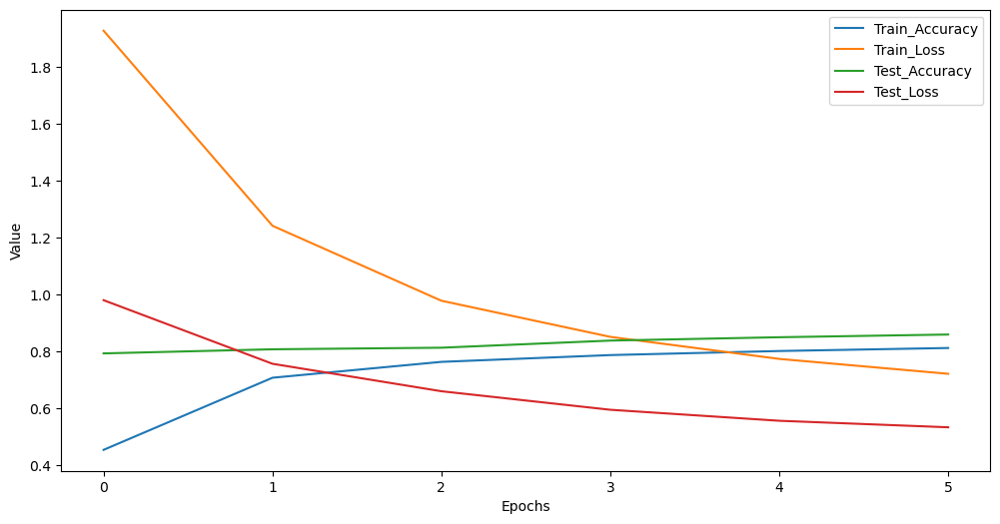

In [9]:
history = pd.DataFrame(history.history)

plt.figure(figsize = (12, 6))
plt.plot(range(len(history['accuracy'].values.tolist())), history['accuracy'].values.tolist(), label = 'Train_Accuracy')
plt.plot(range(len(history['loss'].values.tolist())), history['loss'].values.tolist(), label = 'Train_Loss')
plt.plot(range(len(history['val_accuracy'].values.tolist())), history['val_accuracy'].values.tolist(), label = 'Test_Accuracy')
plt.plot(range(len(history['val_loss'].values.tolist())), history['val_loss'].values.tolist(), label = 'Test_Loss')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.show()

# Results

11/11 [==============================] - 2s 179ms/step


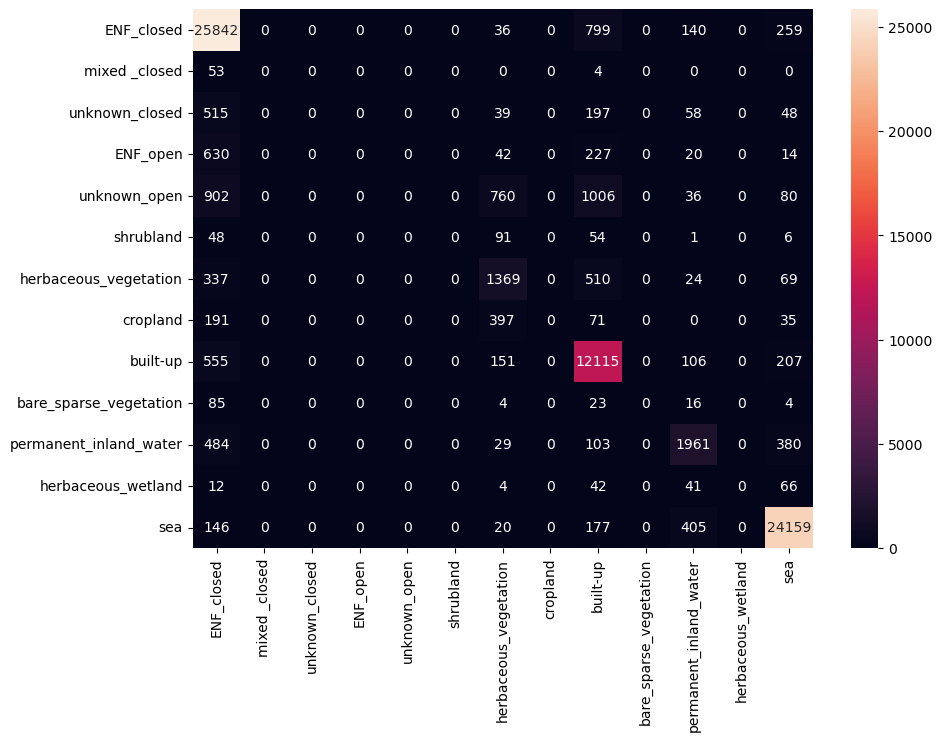

In [10]:
pred = model.predict(X_test, batch_size=1204*6, verbose=1)

plt.figure(figsize = (10,7))

#classes = [f'Class-{i}' for i in range(1, n_classes+1)]
classes = [cat_to_mean[i] for i in unique_classes]

mat = confusion_matrix(np.argmax(y_test, 1),
                            np.argmax(pred, 1))

df_cm = pd.DataFrame(mat, index = classes, columns = classes)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()

In [11]:
# Classification Report
print(classification_report(np.argmax(y_test, 1),
                            np.argmax(pred, 1),
      target_names = classes))

                        precision    recall  f1-score   support

            ENF_closed       0.87      0.95      0.91     27076
         mixed _closed       0.00      0.00      0.00        57
        unknown_closed       0.00      0.00      0.00       857
              ENF_open       0.00      0.00      0.00       933
          unknown_open       0.00      0.00      0.00      2784
             shrubland       0.00      0.00      0.00       200
 herbaceous_vegetation       0.47      0.59      0.52      2309
              cropland       0.00      0.00      0.00       694
              built-up       0.79      0.92      0.85     13134
bare_sparse_vegetation       0.00      0.00      0.00       132
permanent_inland_water       0.70      0.66      0.68      2957
    herbaceous_wetland       0.00      0.00      0.00       165
                   sea       0.95      0.97      0.96     24907

              accuracy                           0.86     76205
             macro avg       0.29     

C:\ProgramData\miniconda3\envs\a301\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\ProgramData\miniconda3\envs\a301\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\ProgramData\miniconda3\envs\a301\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [12]:
# Plotting the CNN classification results

pred_t = model.predict(X.reshape(-1, windowSize, windowSize, K, 1),
                       batch_size=1204*6, verbose=1)

fig = px.imshow(np.argmax(pred_t, axis=1).reshape(data_shape))

fig.update_coloraxes(
    colorscale=px.colors.qualitative.Dark24,
    colorbar_tickvals=list(cat_to_mean.keys()),
    colorbar_ticktext=list(cat_to_mean.values()),
    colorbar_tickmode="array",
)

fig.show()
print(cat_to_mean) # to help reading the plot

36/36 [==============================] - 7s 180ms/step


{0: 'unknown', 1: 'ENF_closed', 2: 'EBF_closed', 3: 'DNF_closed', 4: 'DBF_closed', 5: 'mixed _closed', 6: 'unknown_closed', 7: 'ENF_open', 8: 'EBF_open', 9: 'DNF_open', 10: 'DBF_open', 11: 'mixed _open', 12: 'unknown_open', 13: 'shrubland', 14: 'herbaceous_vegetation', 15: 'cropland', 16: 'built-up', 17: 'bare_sparse_vegetation', 18: 'snow_ice', 19: 'permanent_inland_water', 20: 'herbaceous_wetland', 21: 'moss_lichen', 22: 'sea'}
